In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns

# Compile Metrics

In [2]:
# This is the folder where the many cellranger folders are located.
cr_out = "../crmulti_new/"
gex = [i for i in sorted(os.listdir(cr_out)) if i[-4:]!="_TCR"]
vdj = [i for i in sorted(os.listdir(cr_out)) if i[-4:]=="_TCR"]

compiledmetrics = pd.DataFrame()

for i in sorted(os.listdir(cr_out)):
    config = cr_out+"/"+i+"/outs/config.csv"
    config = pd.read_csv(config)
    name = config.iloc[5,0]
    pso = cr_out+"/"+i+"/outs/per_sample_outs/"+i+"/"
    
    metrics = pd.read_csv(pso+"metrics_summary.csv")
    gex = metrics.iloc[:5,:]
    gex = gex[["Metric Name", "Metric Value"]].T
    gex.columns = gex.loc['Metric Name']
    gex = gex.loc[['Metric Value']]
    gex.index = [name]
    vdj = metrics.iloc[6:14]
    vdj = vdj[["Metric Name", "Metric Value"]].T
    vdj.columns = vdj.loc['Metric Name']
    vdj = vdj.loc[['Metric Value']]
    vdj.index = [name+"_VDJ"]
    
    compiledmetrics = pd.concat([compiledmetrics,gex])
    compiledmetrics = pd.concat([compiledmetrics,vdj])

In [3]:
compiledmetrics.to_csv("cellranger_multi_metrics.csv")

# GEX analysis

In [4]:
rundir = "../crmulti_new"
adatas = []

for i in sorted(os.listdir(rundir)):
    config = rundir+"/"+i+"/outs/config.csv"
    config = pd.read_csv(config)
    name = config.iloc[5,0]
    pso = rundir+"/"+i+"/outs/per_sample_outs/"+i+"/"
    
    gex = sc.read_10x_h5(pso+"count/sample_filtered_feature_bc_matrix.h5")
    gex.obs['sample'] = name
    gex.obs['age'] = name.split("_")[1]
    gex.obs['treatment'] = name.split("_")[2]
    gex.var_names_make_unique()
    adatas.append(gex)
    
adata = ad.concat(adatas, join='outer')
adata.obs_names_make_unique()
adata

/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages

AnnData object with n_obs × n_vars = 72888 × 32285
    obs: 'sample', 'age', 'treatment'

In [5]:
# adata.write_h5ad("crmulti_gex_raw.h5ad")

In [6]:
adata = sc.read_h5ad("crmulti_gex_raw.h5ad")
adata

AnnData object with n_obs × n_vars = 72888 × 32285
    obs: 'sample', 'age', 'treatment'

In [7]:
adata.obs['number_of_genes'] = np.sum(adata.X>0, axis=1)
adata.obs['total_counts'] = np.sum(adata.X, axis=1)

<AxesSubplot: xlabel='number_of_genes', ylabel='Count'>

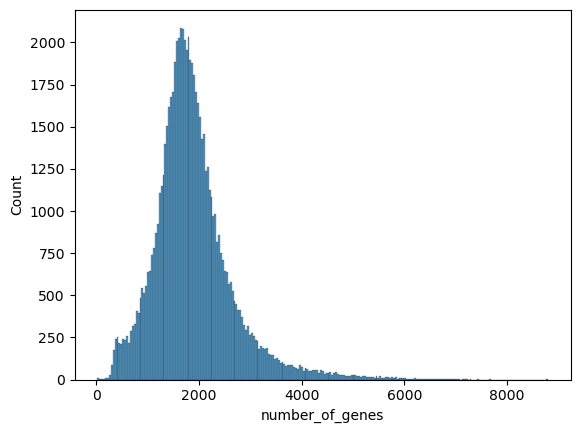

In [8]:
sns.histplot(adata.obs, x='number_of_genes')

<AxesSubplot: xlabel='total_counts', ylabel='Count'>

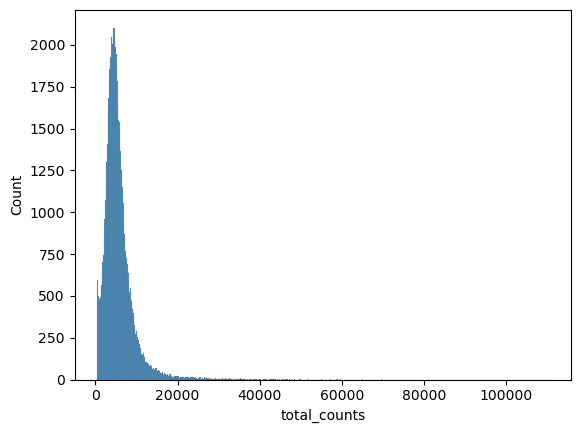

In [9]:
sns.histplot(adata.obs, x='total_counts')

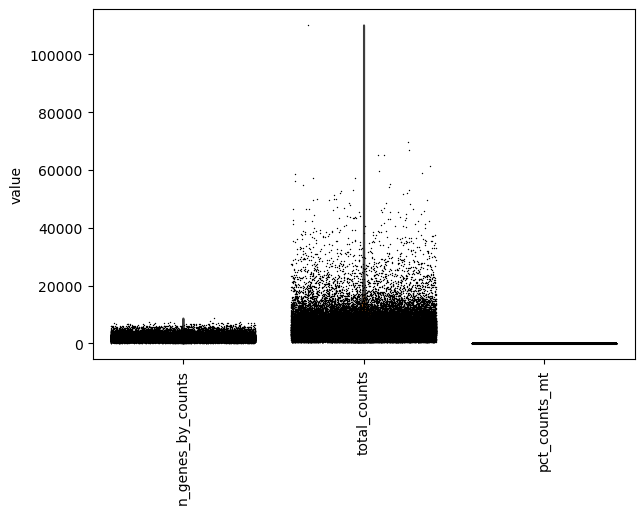

In [10]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata.copy()

adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, rotation=90)

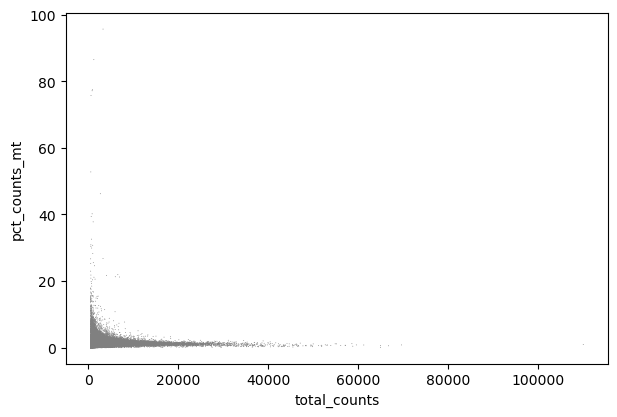

In [11]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')

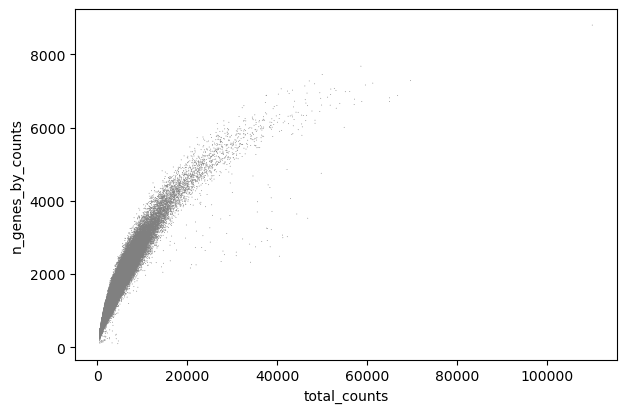

In [12]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
print(adata.X.shape)
adata = adata[adata.obs['pct_counts_mt'] < 35]
print(adata.X.shape)

(72873, 22392)
(72863, 22392)


In [14]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
adata.layers['normcounts'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['lognormcounts'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes = 7000) # min_mean=0.0125, max_mean=3, min_disp=0.5
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts'])
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


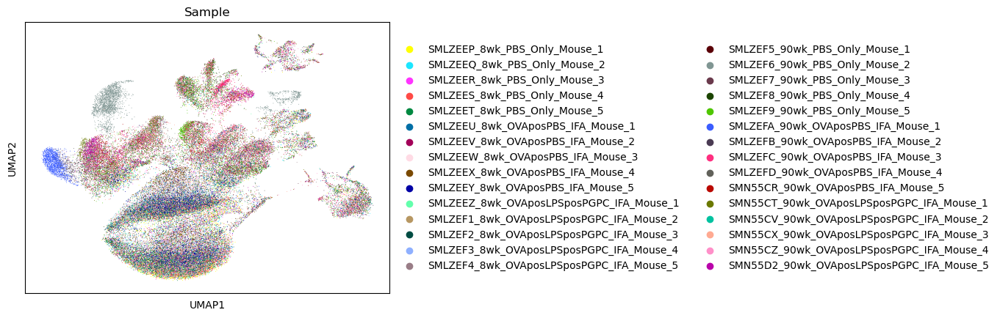

In [15]:
sc.pl.umap(adata, color=['sample'], title=['Sample'])

/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


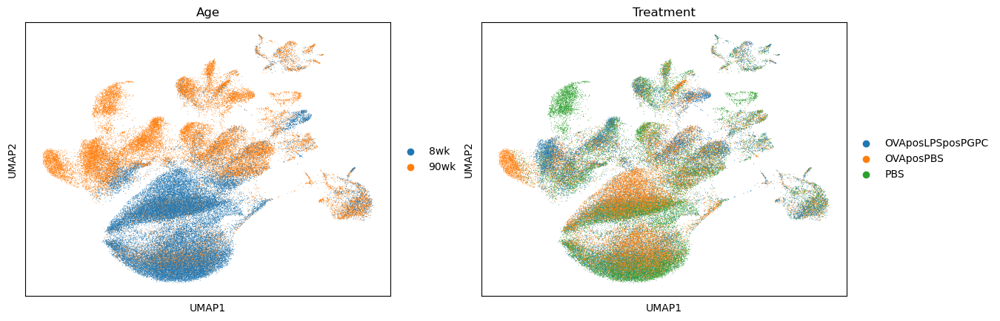

In [16]:
sc.pl.umap(adata, color=['age','treatment'], title=['Age','Treatment'])

## Celltypist

In [17]:
from celltypist import models
import celltypist
models.download_models(force_update = True)

adata.X = adata.layers['counts'].copy()
sc.pp.normalize_total(adata, target_sum=1e4) #10000
adata.layers['normcounts'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['lognormcounts'] = adata.X.copy()

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 44
📂 Storing models in /home/pjoshua/.celltypist/data/models
💾 Downloading model [1/44]: Immune_All_Low.pkl
💾 Downloading model [2/44]: Immune_All_High.pkl
💾 Downloading model [3/44]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [4/44]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [5/44]: Adult_Human_Skin.pkl
💾 Downloading model [6/44]: Adult_Mouse_Gut.pkl
💾 Downloading model [7/44]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [8/44]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [9/44]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [10/44]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [11/44]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [12/44]: COVID19_Immune_Landscape.pkl
💾 Downloading model [13/44]: Cells_Fetal_Lung.pkl
💾 Downloading model [14/44]: Cells_Intestinal_Tract.pkl
💾 Downloading model [15/44]: Cells_Lung_Airway.p

🔬 Input data has 72863 cells and 7000 genes
🔗 Matching reference genes in the model
🧬 3297 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


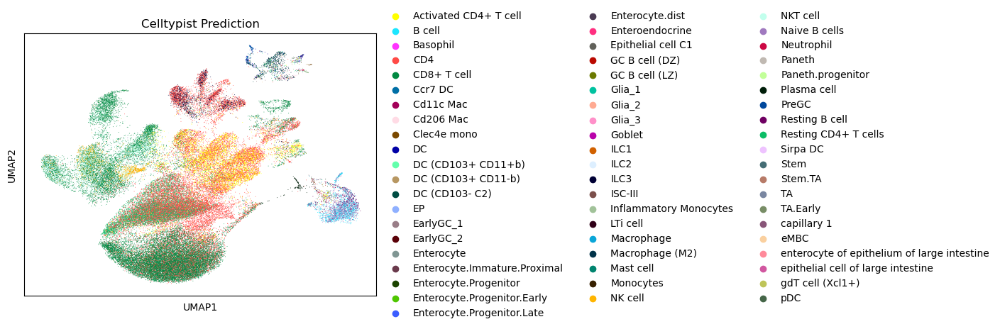

In [18]:
predictions = celltypist.annotate(adata, model = 'Adult_Mouse_Gut.pkl', majority_voting = True)
adata.obs['pl'] = predictions.predicted_labels['predicted_labels']
adata.obs['mv'] = predictions.predicted_labels['majority_voting']
sc.pl.umap(adata, color = ['pl'], title="Celltypist Prediction")

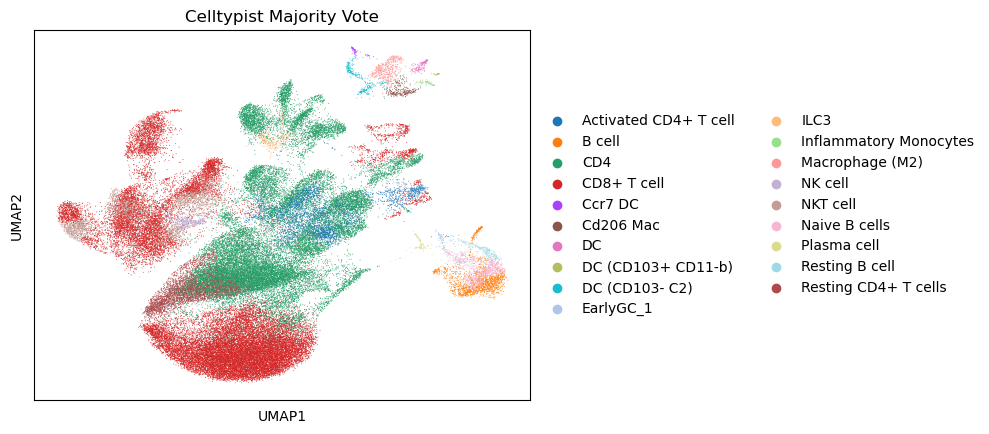

In [19]:
sc.pl.umap(adata, color = ['mv'], title="Celltypist Majority Vote")

## Harmonypy - sample batch correction

In [20]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, 'sample')

2024-03-16 18:03:26,853 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2024-03-16 18:03:41,362 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2024-03-16 18:03:41,588 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2024-03-16 18:03:57,741 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2024-03-16 18:04:14,056 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2024-03-16 18:04:30,355 - harmonypy - INFO - Converged after 3 iterations
Converged after 3 iterations


In [21]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony')
adata.obsm['X_umap_old'] = adata.obsm['X_umap'].copy()
sc.tl.umap(adata)
adata.obsm['X_umap_harmony'] = adata.obsm['X_umap'].copy()

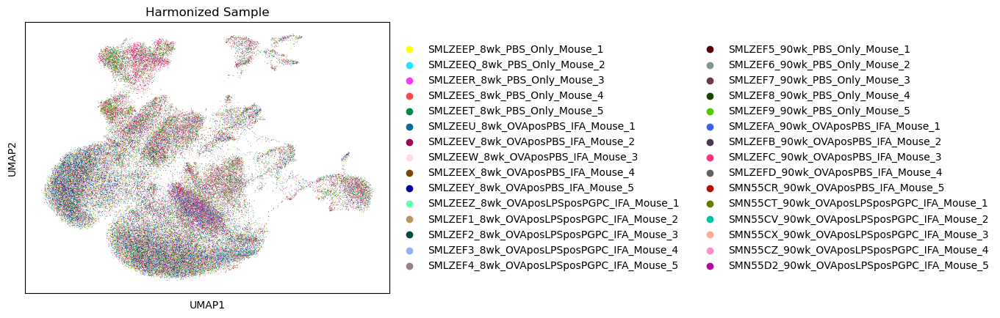

In [22]:
sc.pl.umap(adata, color='sample', title="Harmonized Sample")

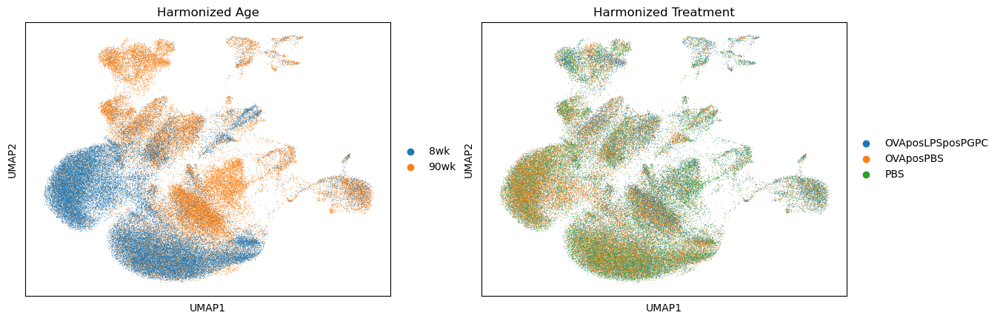

In [23]:
sc.pl.umap(adata, color=['age', 'treatment'], title=["Harmonized Age","Harmonized Treatment"])

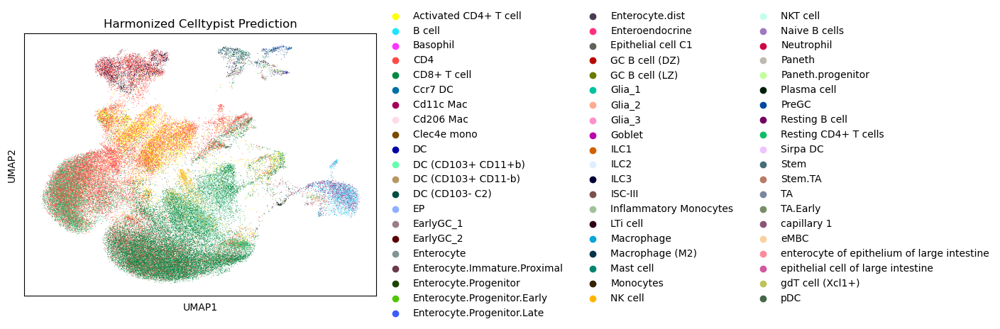

In [24]:
sc.pl.umap(adata, color=['pl'], title="Harmonized Celltypist Prediction")

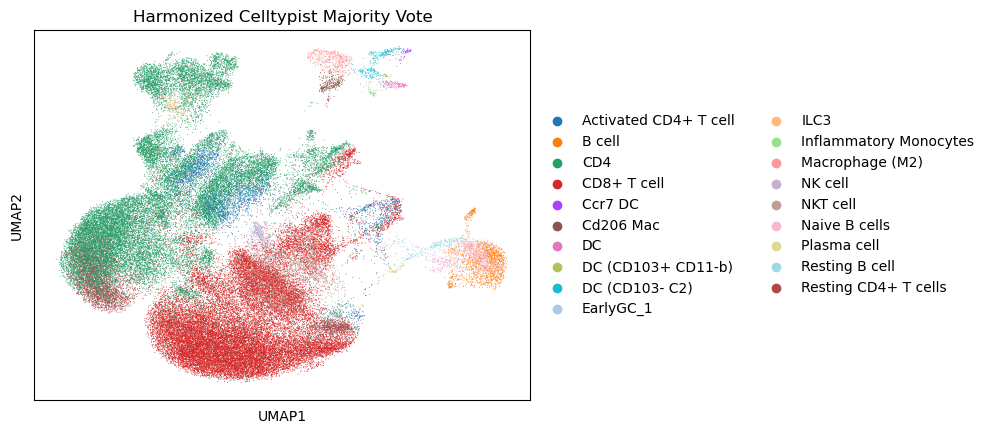

In [25]:
sc.pl.umap(adata, color=['mv'], title="Harmonized Celltypist Majority Vote")

In [26]:
adata.obs['mv'].value_counts()

CD8+ T cell               30338
CD4                       27006
Resting CD4+ T cells       4086
Activated CD4+ T cell      3247
NKT cell                   3018
B cell                     1467
Naive B cells              1074
Macrophage (M2)             485
NK cell                     469
DC (CD103- C2)              302
ILC3                        276
Cd206 Mac                   271
Resting B cell              253
EarlyGC_1                   171
DC                          148
Plasma cell                  91
Inflammatory Monocytes       72
Ccr7 DC                      66
DC (CD103+ CD11-b)           23
Name: mv, dtype: int64

In [27]:
# adata.write_h5ad("crmulti_gex_pp.h5ad")

# Leiden Clustering + DEGs

In [28]:
res = 0.1
sc.tl.leiden(adata, resolution=res)

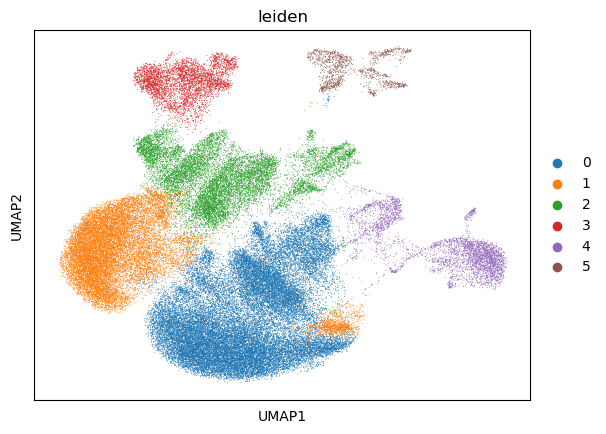

In [29]:
sc.pl.umap(adata, color=['leiden'], ncols=3,cmap="Reds") #bwr

In [30]:
print(adata.X.shape)
bgenes = [i for i in adata.var_names.tolist() if (i.startswith("Rps") or i.startswith("Rpl") or i.startswith("mt"))]
adata = adata[:,[i for i in adata.var_names.tolist() if i not in bgenes]]
print(adata.X.shape)

(72863, 7000)
(72863, 6962)


In [31]:
# adata.X = adata.layers['lognormcounts']
sc.tl.rank_genes_groups(adata, groupby="leiden", use_raw=False, method='wilcoxon', layer='lognormcounts')

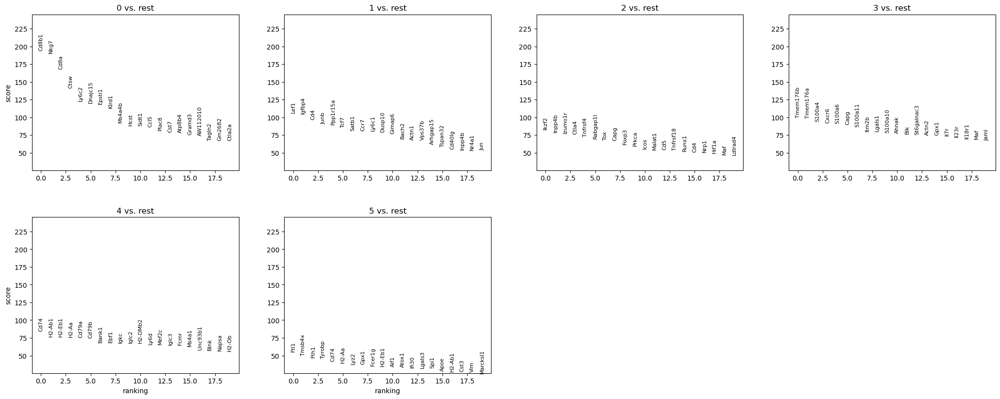

In [32]:
sc.pl.rank_genes_groups(adata)

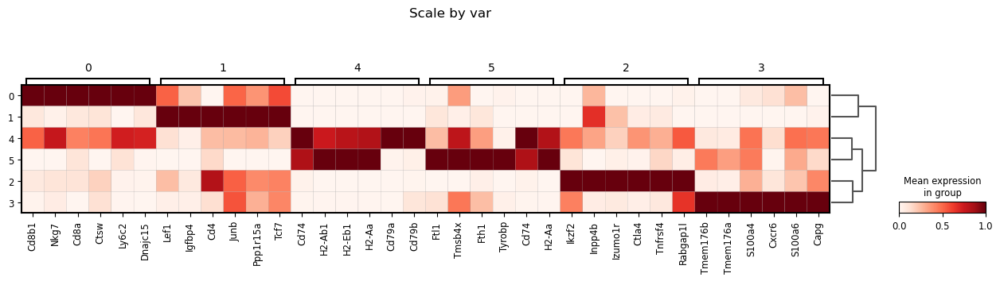

In [33]:
sc.tl.dendrogram(adata, groupby="leiden")
cmp = "Reds"
sc.pl.rank_genes_groups_matrixplot(adata, cmap=cmp,standard_scale='var', n_genes=6, dendrogram=True, title="Scale by var")

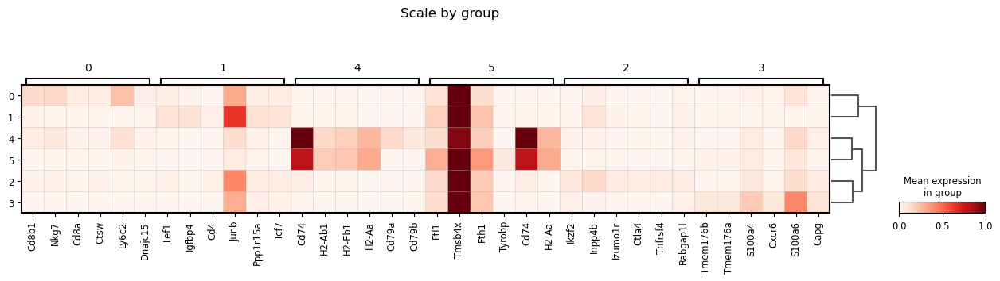

In [34]:
sc.pl.rank_genes_groups_matrixplot(adata, cmap=cmp,standard_scale='group', n_genes=6, dendrogram=True, title="Scale by group")

In [35]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df.to_csv("leiden_degs_{}_no_rpl_mt.csv".format(res))

In [36]:
adata.obs['leid_samp'] = adata.obs['sample'].astype(str) + "_" + adata.obs['leiden'].astype(str)
# adata.write_h5ad("crmulti_gex_res_{}_no_rpl_mt.h5ad".format(res))

# Separate T cells - Recluster

In [37]:
res = 0.1
adata = sc.read_h5ad("crmulti_gex_res_{}_no_rpl_mt.h5ad".format(res))
print(adata.X.shape)
adata.obs['leiden'] = adata.obs['leiden'].astype(str)
# After looking at the DEGs we determined leiden clusters 5 and 8 to be non-T cell clusters.
adata = adata[adata.obs.leiden != '5']
adata = adata[adata.obs.leiden != '8']
print(adata.X.shape)

(72863, 22279)
(68502, 22279)


In [38]:
import scanpy.external as sce
sce.pp.harmony_integrate(adata, 'sample')

sc.pp.neighbors(adata, use_rep='X_pca_harmony')
# adata.obsm['X_umap_old'] = adata.obsm['X_umap'].copy()
sc.tl.umap(adata)
adata.obsm['X_umap_harmony'] = adata.obsm['X_umap'].copy()

2024-03-16 18:06:07,094 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2024-03-16 18:06:20,771 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2024-03-16 18:06:20,975 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2024-03-16 18:06:35,060 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2024-03-16 18:06:49,210 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2024-03-16 18:07:03,173 - harmonypy - INFO - Converged after 3 iterations
Converged after 3 iterations


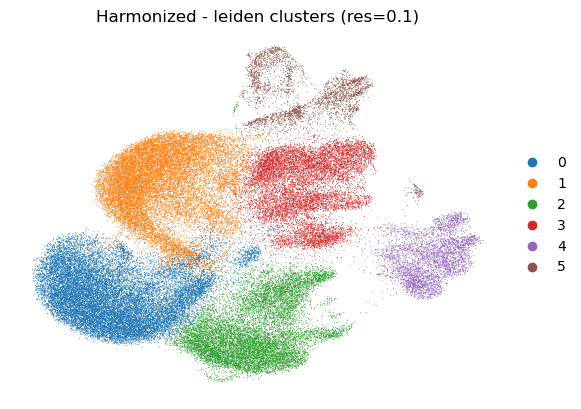

In [39]:
res = 0.1
sc.tl.leiden(adata, resolution=res)
sc.pl.umap(adata, color=['leiden'], ncols=3,cmap="Reds", title="Harmonized - leiden clusters (res={})".format(res), frameon=False) #bwr

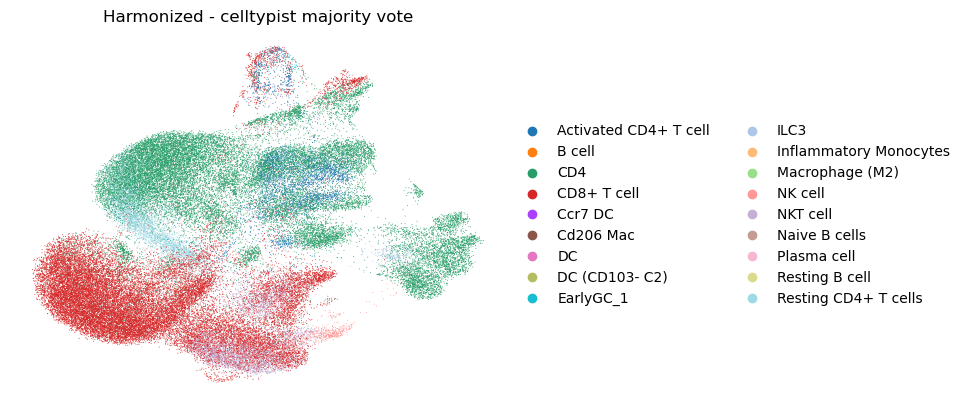

In [40]:
sc.pl.umap(adata, color=['mv'], ncols=3,cmap="Reds", title="Harmonized - celltypist majority vote", frameon=False) #bwr

In [41]:
adata.obs['leid_samp'] = adata.obs['sample'].astype(str) + "_" + adata.obs['leiden'].astype(str)
# adata.write_h5ad("crmulti_gex_res_{}_tcells.h5ad".format(res))

# T cells only celltypist

In [42]:
from celltypist import models
import celltypist
models.download_models(force_update = True)
res = 0.1

adata = sc.read_h5ad("crmulti_gex_res_{}_tcells.h5ad".format(res))

adata.X = adata.layers['counts'].copy()
sc.pp.normalize_total(adata, target_sum=1e4) #10000
adata.layers['normcounts'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['lognormcounts'] = adata.X.copy()

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 44
📂 Storing models in /home/pjoshua/.celltypist/data/models
💾 Downloading model [1/44]: Immune_All_Low.pkl
💾 Downloading model [2/44]: Immune_All_High.pkl
💾 Downloading model [3/44]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [4/44]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [5/44]: Adult_Human_Skin.pkl
💾 Downloading model [6/44]: Adult_Mouse_Gut.pkl
💾 Downloading model [7/44]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [8/44]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [9/44]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [10/44]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [11/44]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [12/44]: COVID19_Immune_Landscape.pkl
💾 Downloading model [13/44]: Cells_Fetal_Lung.pkl
💾 Downloading model [14/44]: Cells_Intestinal_Tract.pkl
💾 Downloading model [15/44]: Cells_Lung_Airway.p

In [43]:
predictions = celltypist.annotate(adata, model = 'Adult_Mouse_Gut.pkl', majority_voting = True)
adata.obs['pl_new'] = predictions.predicted_labels['predicted_labels']
adata.obs['mv_new'] = predictions.predicted_labels['majority_voting']
# adata.write_h5ad("crmulti_gex_res_{}_tcells.h5ad".format(res))

🔬 Input data has 68502 cells and 22279 genes
🔗 Matching reference genes in the model
🧬 7255 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


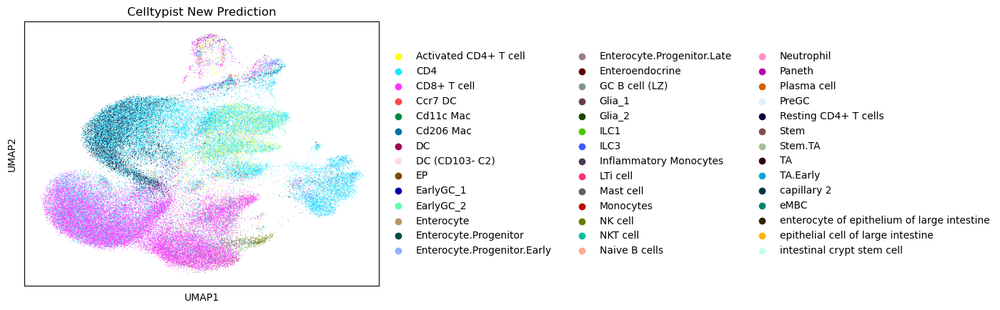

In [44]:
sc.pl.umap(adata, color = ['pl_new'], title="Celltypist New Prediction")

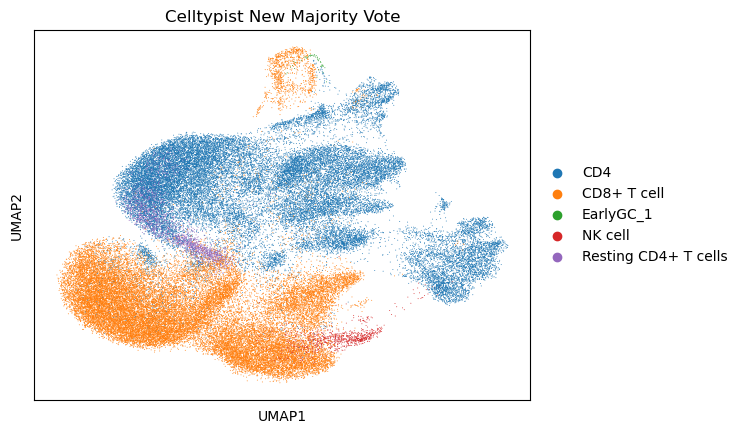

In [45]:
sc.pl.umap(adata, color = ['mv_new'], title="Celltypist New Majority Vote")

# Plots - Harmonized T cells only

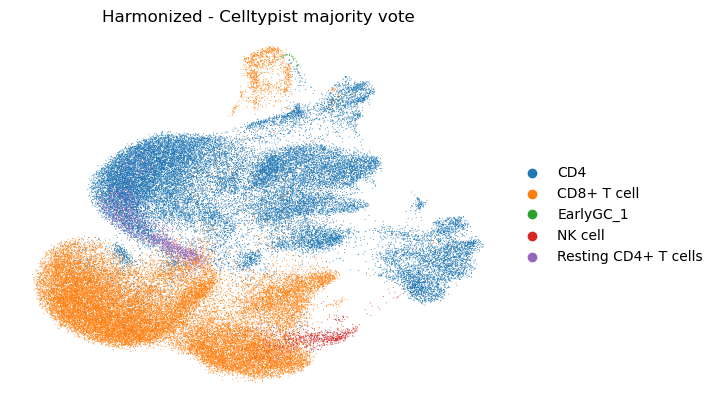

In [46]:
res = 0.1
adata = sc.read_h5ad("crmulti_gex_res_{}_tcells.h5ad".format(res))
sc.pl.umap(adata, color=['mv_new'], ncols=3, title="Harmonized - Celltypist majority vote", frameon=False) #bwr

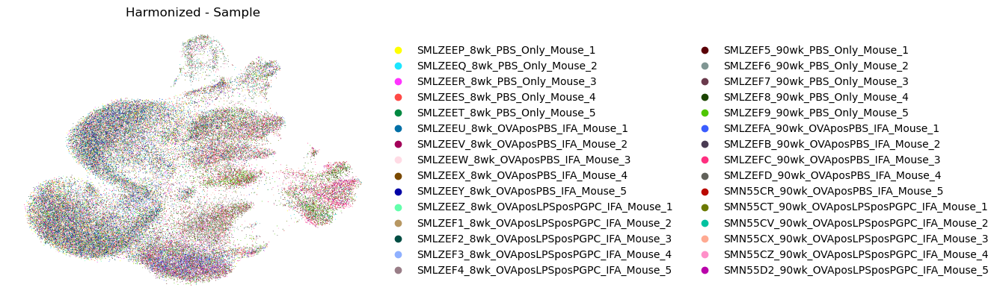

In [47]:
sc.pl.umap(adata, color=['sample'], ncols=3,cmap="Reds", title="Harmonized - Sample", frameon=False) #bwr

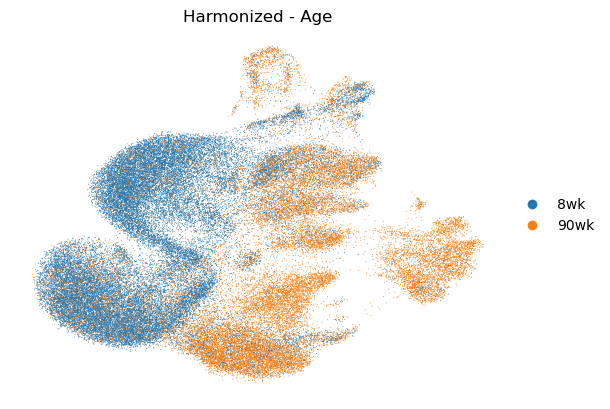

In [48]:
sc.pl.umap(adata, color=['age'], ncols=3,cmap="Reds", title="Harmonized - Age", frameon=False) #bwr

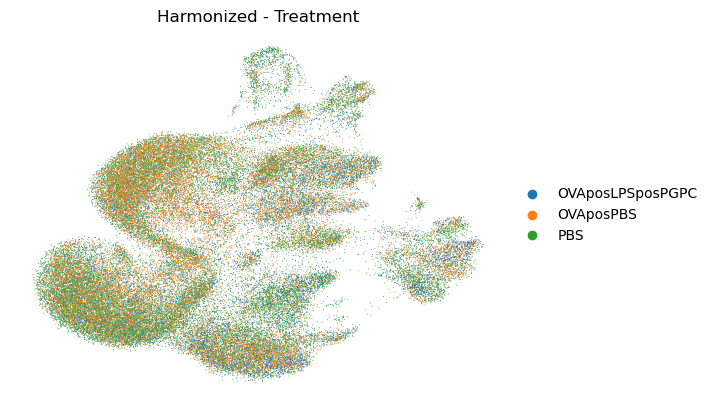

In [49]:
sc.pl.umap(adata, color=['treatment'], ncols=3,cmap="Reds", title="Harmonized - Treatment", frameon=False) #bwr

... storing 'group' as categorical


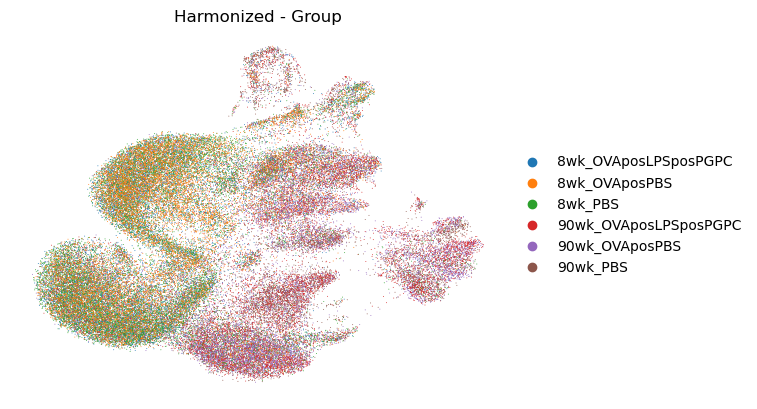

In [50]:
adata.obs['group'] = adata.obs[['age', 'treatment']].agg('_'.join, axis=1)

sc.pl.umap(adata, color=['group'], ncols=3,cmap="Reds", title="Harmonized - Group", frameon=False) #bwr

# Rank Genes - Gene Expression Plots

In [51]:
# adata = sc.read_h5ad("crmulti_gex_pp_full.h5ad")

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


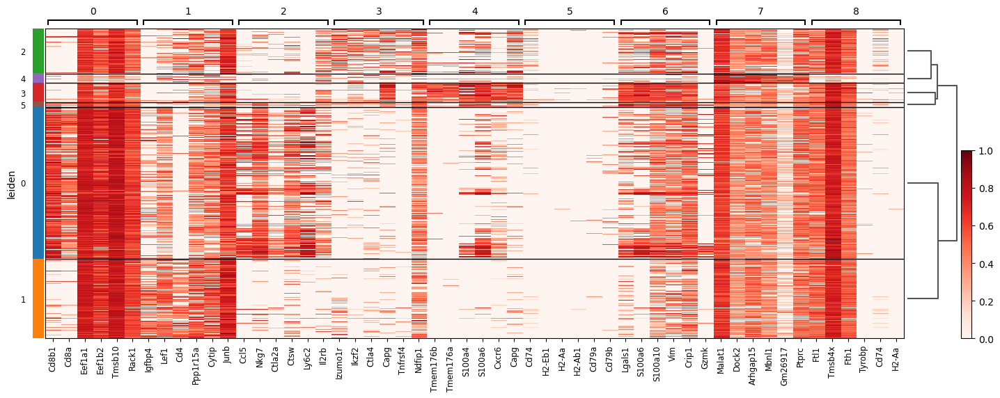

In [52]:
sc.tl.dendrogram(adata, groupby="leiden")
sc.pl.rank_genes_groups_heatmap(adata, cmap="Reds",standard_scale='var', n_genes=6, show_gene_labels=True)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


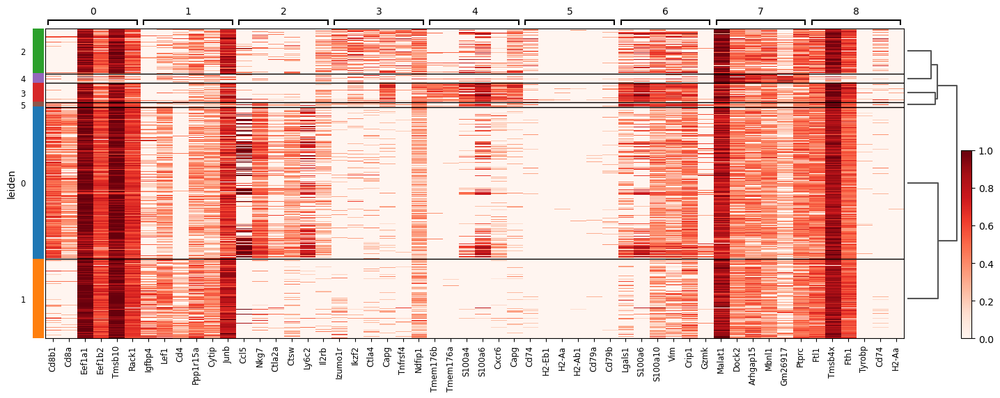

In [53]:
sc.pl.rank_genes_groups_heatmap(adata, cmap="Reds",standard_scale='obs', n_genes=6, show_gene_labels=True)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


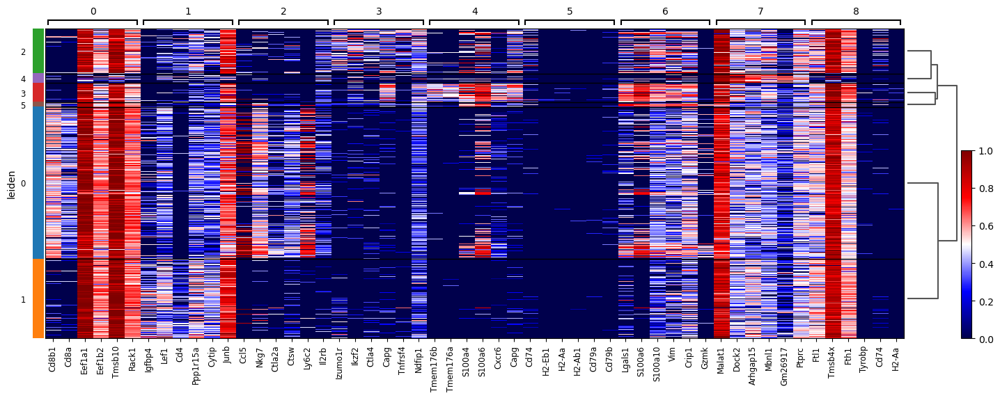

In [54]:
sc.pl.rank_genes_groups_heatmap(adata, cmap="seismic",standard_scale='obs', n_genes=6, show_gene_labels=True)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


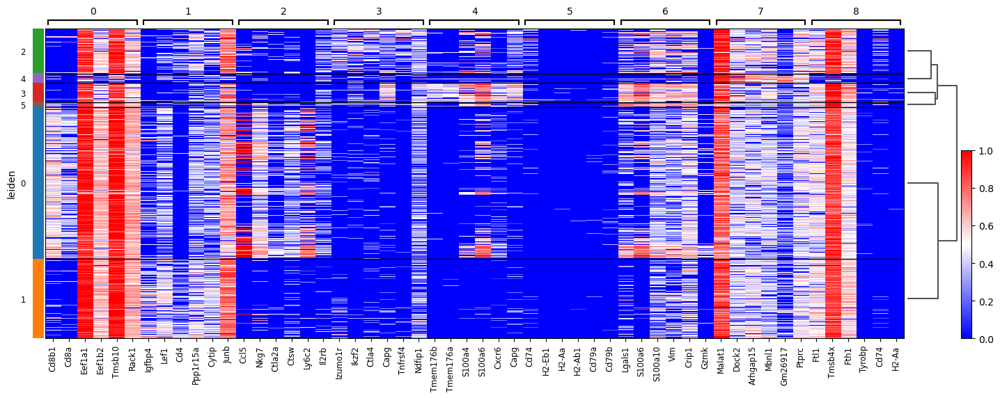

In [55]:
sc.pl.rank_genes_groups_heatmap(adata, cmap="bwr",standard_scale='obs', n_genes=6, show_gene_labels=True)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


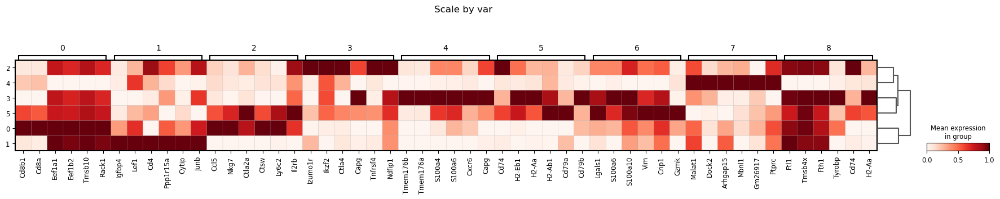

In [56]:
cmp = "Reds"
sc.pl.rank_genes_groups_matrixplot(adata, cmap=cmp,standard_scale='var', n_genes=6, dendrogram=True, title="Scale by var")

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


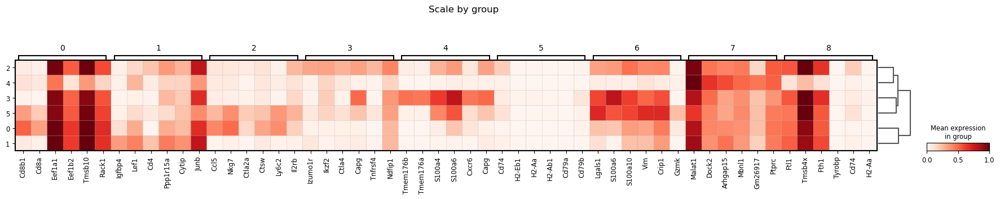

In [57]:
sc.pl.rank_genes_groups_matrixplot(adata, cmap=cmp,standard_scale='group', n_genes=6, dendrogram=True, title="Scale by group")

In [58]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df.to_csv("leiden_degs_{}.csv".format(res))

In [59]:
# adata.write_h5ad("crmulti_gex_pp_full.h5ad")

# Only T cells

/home/pjoshua/miniconda3/envs/scanpy-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


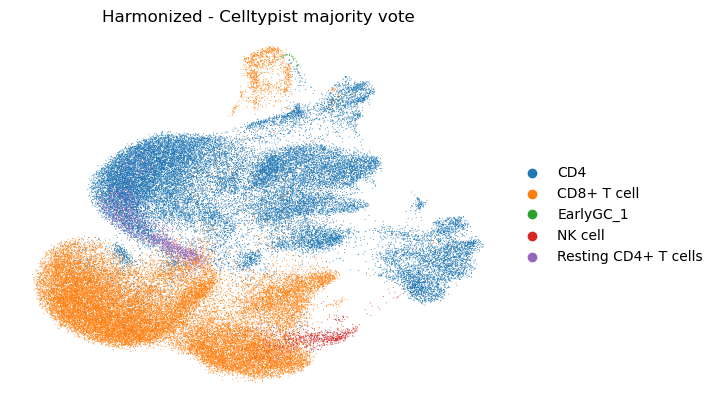

In [2]:
res = 0.1
adata = sc.read_h5ad("crmulti_gex_res_{}_tcells.h5ad".format(res))
sc.pl.umap(adata, color=['mv_new'], ncols=3, title="Harmonized - Celltypist majority vote", frameon=False) #bwr

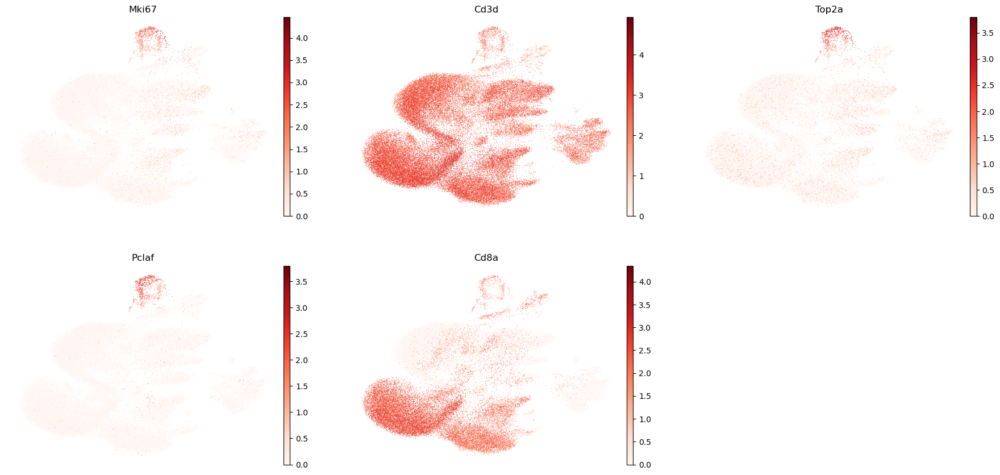

In [10]:
sc.pl.umap(adata, color=['Mki67', 'Cd3d', 'Top2a','Pclaf', 'Cd8a'], ncols=3, frameon=False, cmap='Reds') # Cycling CD8 T cell Markers

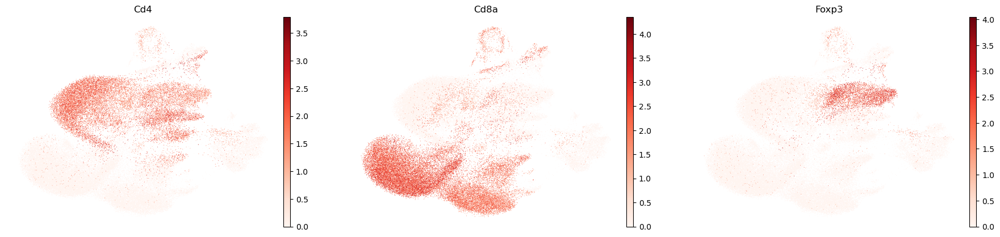

In [61]:
sc.pl.umap(adata, color=['Cd4', 'Cd8a', 'Foxp3'], ncols=3, frameon=False, cmap='Reds') # Canonical markers

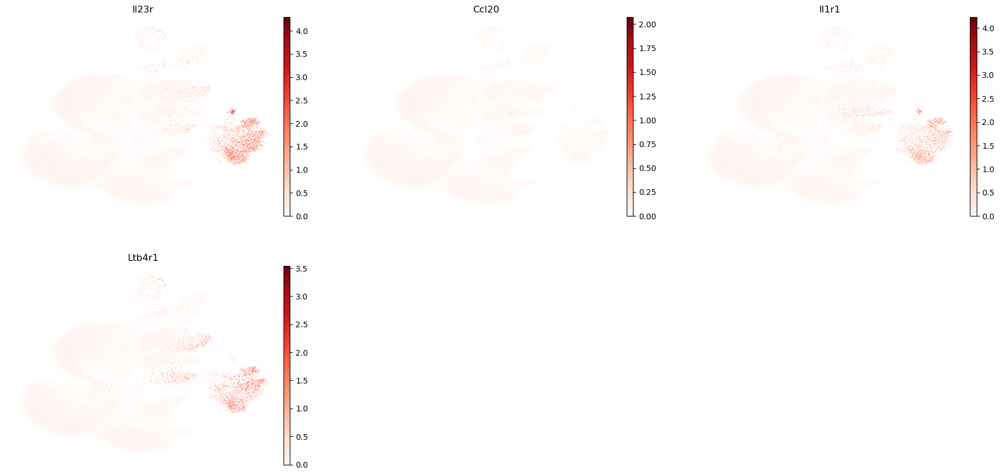

In [62]:
sc.pl.umap(adata, color=['Il23r','Ccl20','Il1r1','Ltb4r1'], ncols=3, frameon=False, cmap='Reds') # Th17 marker genes

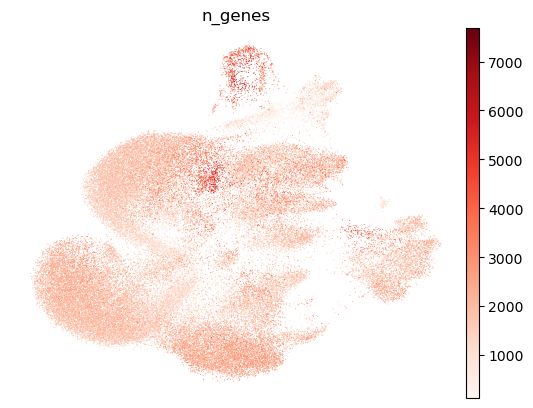

In [63]:
sc.pl.umap(adata, color=['n_genes'], ncols=3, frameon=False, cmap='Reds') # number of genes

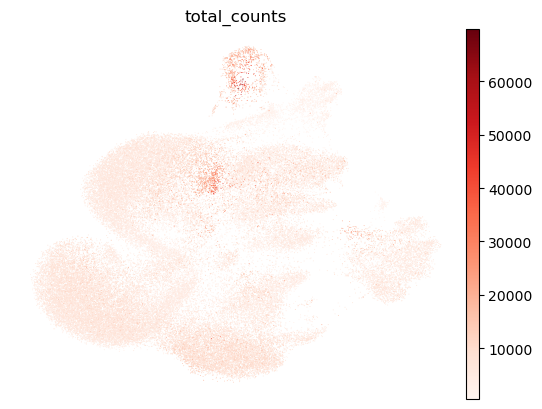

In [64]:
sc.pl.umap(adata, color=['total_counts'], ncols=3, frameon=False, cmap='Reds') # total counts per cell

In [66]:
adata.obs.groupby(by='leiden')['n_genes'].median()

leiden
0    1866.0
1    1708.0
2    1767.0
3    1980.0
4     880.0
5    3898.0
Name: n_genes, dtype: float64

In [67]:
adata.obs.groupby(by='leiden')['total_counts'].median()

leiden
0     5538.0
1     4742.5
2     4058.5
3     4735.0
4     1453.0
5    14919.0
Name: total_counts, dtype: float32

# Leiden Based Cell Typing

In [68]:
adata.obs['leiden_based_cts'] = adata.obs['leiden'].copy()

cts_dict = {'0':'Cd8+ T cells',
           '1':'Cd4+ T cells',
           '2':'Cd4+ T cells (Tregs)',
           '3':'Th17 cells',
           '4':'Low quality cells',
           '5':'Cycling Cd8+ T cells'}

adata.obs['leiden_based_cts'] = [cts_dict[i] for i in adata.obs['leiden_based_cts']]

## Sub cluster leiden group 2 to find Tregs

... storing 'leiden_based_cts' as categorical


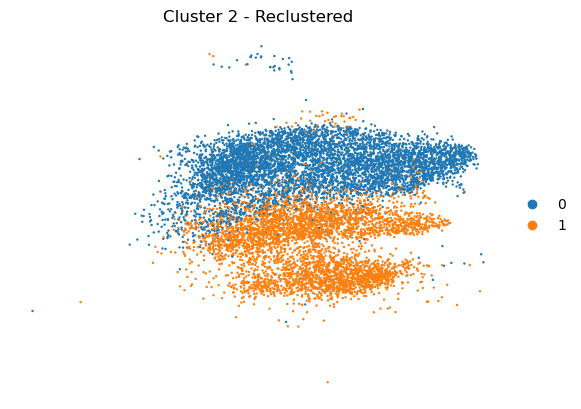

In [69]:
cluster2 = adata[adata.obs['leiden']=='2']
res = 0.1
sc.tl.leiden(cluster2, resolution=res)
sc.pl.umap(cluster2, color=['leiden'], ncols=3, title="Cluster 2 - Reclustered", frameon=False) #bwr

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


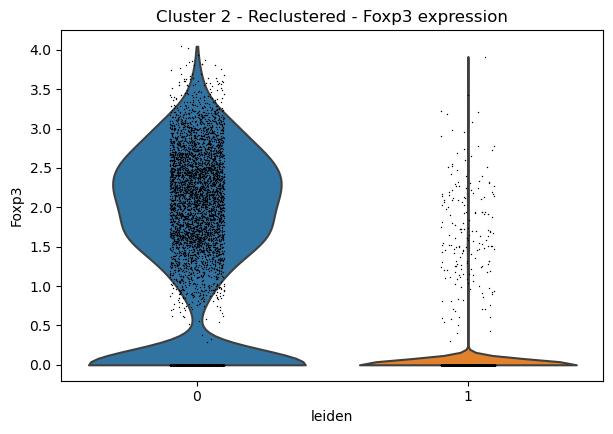

In [70]:
ax = sc.pl.violin(cluster2, 'Foxp3', groupby='leiden', show=False)
ax.set_title("Cluster 2 - Reclustered - Foxp3 expression");

In [71]:
cluster2.obs['leid_samp'] = cluster2.obs['sample'].astype(str) + "_" + cluster2.obs['leiden'].astype(str)
cluster2.obs['leiden_based_cts'] = cluster2.obs['leiden'].copy()
cts_dict = {'0':'Tregs',
           '1':'Cd4+ T cells'}
cluster2.obs['leiden_based_cts'] = [cts_dict[i] for i in cluster2.obs['leiden_based_cts']]
# cluster2.write_h5ad("./adatas/group2only_tregs.h5ad".format(res))

... storing 'leid_samp' as categorical
... storing 'leiden_based_cts' as categorical


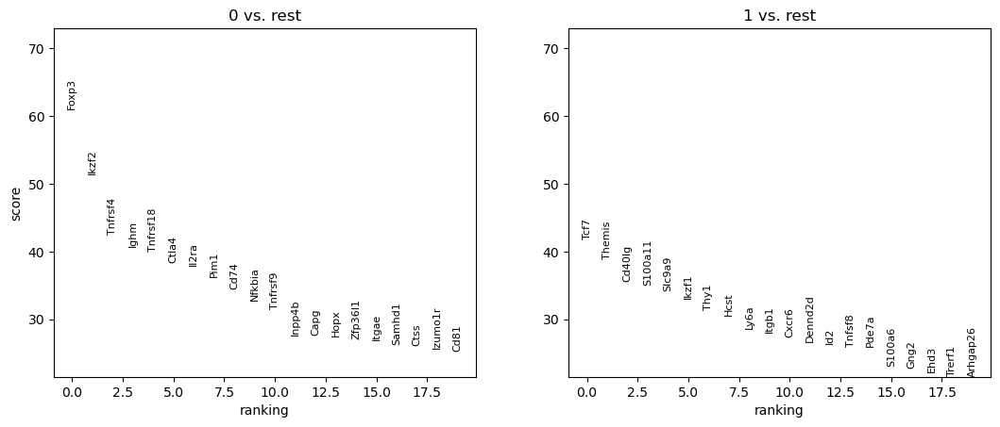

In [72]:
cluster2.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(cluster2, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(cluster2)

/tmp/ipykernel_2553/5618560.py:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  adata.obs.loc[:,i] = adata.obs.loc[:,i].astype(str)
... storing 'sample' as categorical
... storing 'age' as categorical
... storing 'treatment' as categorical
... storing 'pl' as categorical
... storing 'mv' as categorical
... storing 'leiden' as categorical
... storing 'leid_samp' as categorical
... storing 'pl_new' as categorical
... storing 'mv_new' as categorical
... storing 'leiden_based_cts' as categorical


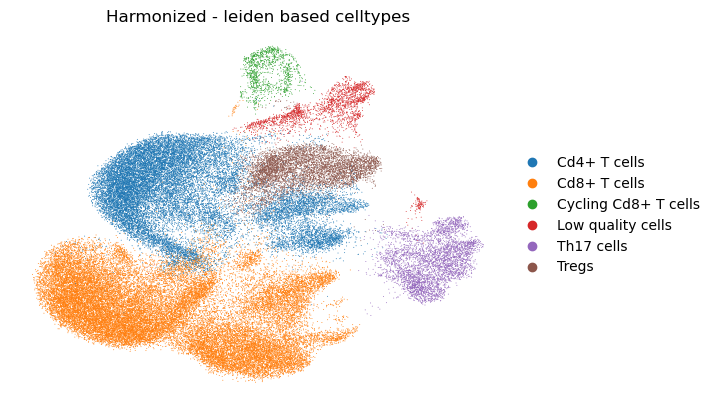

In [73]:
for i in adata.obs.columns.tolist():
    adata.obs.loc[:,i] = adata.obs.loc[:,i].astype(str)
adata.obs.loc[cluster2.obs.index,:] = cluster2.obs
sc.pl.umap(adata, color=['leiden_based_cts'], ncols=3, title="Harmonized - leiden based celltypes", frameon=False) #bwr

In [74]:
for i in adata.obs.columns.tolist():
    adata.obs.loc[:,i] = adata.obs.loc[:,i].astype(str)
# adata.write_h5ad("./adatas/crmulti_gex_tcells.h5ad") # This is the final adata with all T cells!

/tmp/ipykernel_2553/2192464812.py:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  adata.obs.loc[:,i] = adata.obs.loc[:,i].astype(str)
